<a href="https://colab.research.google.com/github/bushranajeeb/Image-matting/blob/main/BG_removal_p1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!gdown https://drive.google.com/uc?id=1ueK8sy2LclIjK5OsVYYk1a5K-rbUYbxk -O input.mp4

Downloading...
From: https://drive.google.com/uc?id=1ueK8sy2LclIjK5OsVYYk1a5K-rbUYbxk
To: /content/input.mp4
100% 44.8M/44.8M [00:00<00:00, 277MB/s]


In [ ]:
!gdown https://drive.google.com/uc?id=1fYPzaFryhTZNagQKKN15iC3HkS2cp_t5 -O bg.mp4

Downloading...
From: https://drive.google.com/uc?id=1fYPzaFryhTZNagQKKN15iC3HkS2cp_t5
To: /content/bg.mp4
100% 5.50M/5.50M [00:00<00:00, 251MB/s]


In [ ]:
import cv2 
import os


vid_capture = cv2.VideoCapture('input.mp4')
dst = "/content/drive/MyDrive/input_frames"


os.makedirs(dst, exist_ok=True)

if (vid_capture.isOpened() == False):
	print("Error opening the video file")
# Read fps and frame count
else:
	# Get frame rate information
	# You can replace 5 with CAP_PROP_FPS as well, they are enumerations
	fps = vid_capture.get(cv2.CAP_PROP_FPS)
	print('Frames per second : ', fps,'FPS')

	# Get frame count
	# You can replace 7 with CAP_PROP_FRAME_COUNT as well, they are enumerations
	frame_count = vid_capture.get(cv2.CAP_PROP_FPS)
	print('Frame count : ', frame_count)
i =0;
while(vid_capture.isOpened()):
	# vid_capture.read() methods returns a tuple, first element is a bool 
	# and the second is frame
	ret, frame = vid_capture.read()
	if ret == True:
		i = i+1
		#cv2.imwrite('Frame',frame)
		#for i in frame_count:
		cv2.imwrite(os.path.join(dst,"frame_NIR_%06d.jpg" % (i)),frame)
		# 20 is in milliseconds, try to increase the value, say 50 and observe
		key = cv2.waitKey(1)
		
		if key == ord('q'):
			break
	else:
		break

# Release the video capture object
vid_capture.release()
cv2.destroyAllWindows()

Frames per second :  59.9931748379024 FPS
Frame count :  59.9931748379024


In [ ]:
import cv2 
import os

# Create a video capture object, in this case we are reading the video from a file
vid_capture = cv2.VideoCapture('bg.mp4')
dst = "/content/drive/MyDrive/bg_frames"

os.makedirs(dst, exist_ok=True)

if (vid_capture.isOpened() == False):
	print("Error opening the video file")
# Read fps and frame count
else:
	# Get frame rate information
	# You can replace 5 with CAP_PROP_FPS as well, they are enumerations
	fps = vid_capture.get(5)
	print('Frames per second : ', fps,'FPS')

	# Get frame count
	# You can replace 7 with CAP_PROP_FRAME_COUNT as well, they are enumerations
	frame_count = vid_capture.get(7)
	print('Frame count : ', frame_count)
i =0;
while(vid_capture.isOpened()):
	# vid_capture.read() methods returns a tuple, first element is a bool 
	# and the second is frame
	ret, frame = vid_capture.read()
	if ret == True:
		i = i+1
		#cv2.imwrite('Frame',frame)
		#for i in frame_count:
		cv2.imwrite(os.path.join(dst,"frame_NIR_%06d.jpg" % (i)),frame)
		# 20 is in milliseconds, try to increase the value, say 50 and observe
		key = cv2.waitKey(20)
		
		if key == ord('q'):
			break
	else:
		break

# Release the video capture object
vid_capture.release()
cv2.destroyAllWindows()

Frames per second :  29.97002997002997 FPS
Frame count :  240.0


Dont use code mentioned below. Go to part 2

In [ ]:
from torchvision import models
from PIL import Image
import matplotlib.pyplot as plt
import torch
import numpy as np
import cv2
# Apply the transformations needed
import torchvision.transforms as T
import os
from google.colab.patches import cv2_imshow

dst = "/content/drive/MyDrive/output_frames"
# Define the helper function
def decode_segmap(image, source, bgimg, nc=21):
  
  label_colors = np.array([(0, 0, 0),  # 0=background
               # 1=aeroplane, 2=bicycle, 3=bird, 4=boat, 5=bottle
               (128, 0, 0), (0, 128, 0), (128, 128, 0), (0, 0, 128), (128, 0, 128),
               # 6=bus, 7=car, 8=cat, 9=chair, 10=cow
               (0, 128, 128), (128, 128, 128), (64, 0, 0), (192, 0, 0), (64, 128, 0),
               # 11=dining table, 12=dog, 13=horse, 14=motorbike, 15=person
               (192, 128, 0), (64, 0, 128), (192, 0, 128), (64, 128, 128), (192, 128, 128),
               # 16=potted plant, 17=sheep, 18=sofa, 19=train, 20=tv/monitor
               (0, 64, 0), (128, 64, 0), (0, 192, 0), (128, 192, 0), (0, 64, 128)])

  r = np.zeros_like(image).astype(np.uint8)
  g = np.zeros_like(image).astype(np.uint8)
  b = np.zeros_like(image).astype(np.uint8)
  
  for l in range(0, nc):
    idx = image == l
    r[idx] = label_colors[l, 0]
    g[idx] = label_colors[l, 1]
    b[idx] = label_colors[l, 2]
    
    
  rgb = np.stack([r, g, b], axis=2)
  
  # Load the foreground input image 
  foreground = cv2.imread(source)

  # Load the background input image 
  background = cv2.imread(bgimg)

  # Change the color of foreground image to RGB 
  # and resize images to match shape of R-band in RGB output map
  foreground = cv2.cvtColor(foreground, cv2.COLOR_BGR2RGB)
  background = cv2.cvtColor(background, cv2.COLOR_BGR2RGB)
  foreground = cv2.resize(foreground,(r.shape[1],r.shape[0]))
  background = cv2.resize(background,(r.shape[1],r.shape[0]))
  

  # Convert uint8 to float
  foreground = foreground.astype(float)
  background = background.astype(float)

  # Create a binary mask of the RGB output map using the threshold value 0
  th, alpha = cv2.threshold(np.array(rgb),0,255, cv2.THRESH_BINARY)

  # Apply a slight blur to the mask to soften edges
  alpha = cv2.GaussianBlur(alpha, (7,7),0)

  # Normalize the alpha mask to keep intensity between 0 and 1
  alpha = alpha.astype(float)/255

  # Multiply the foreground with the alpha matte
  foreground = cv2.multiply(alpha, foreground)  
  
  # Multiply the background with ( 1 - alpha )
  background = cv2.multiply(1.0 - alpha, background)  
  
  # Add the masked foreground and background
  outImage = cv2.add(foreground, background)

  # Return a normalized output image for display
  return outImage/255

def segment(net, path, bgimagepath, show_orig=True, dev='cuda'):
  img = Image.open(path)
  
  if show_orig: plt.imshow(img); plt.axis('off'); plt.show()
  # Comment the Resize and CenterCrop for better inference results
  trf = T.Compose([T.Resize(400), 
                   #T.CenterCrop(224), 
                   T.ToTensor(), 
                   T.Normalize(mean = [0.485, 0.456, 0.406], 
                               std = [0.229, 0.224, 0.225])])
  inp = trf(img).unsqueeze(0).to(dev)
  out = net.to(dev)(inp)['out']
  om = torch.argmax(out.squeeze(), dim=0).detach().cpu().numpy()
  #cv2.imwrite(os.path.join(dst,"frame_NIR_%06d.jpg" % (i)),rgb)
  
  rgb = decode_segmap(om, path, bgimagepath)
  norm_image = cv2.normalize(rgb, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
  
    
  #plt.imshow(rgb); plt.axis('off'); plt.show()
  cv2_imshow(normalized)
  #cv2.imwrite(os.path.join(dst,"frame_NIR_%06d.jpg" % (bb)),rgb*255)
  
  

  
 

dlab = models.segmentation.deeplabv3_resnet101(pretrained=1).eval()



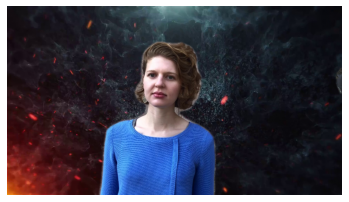

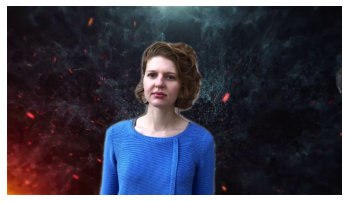

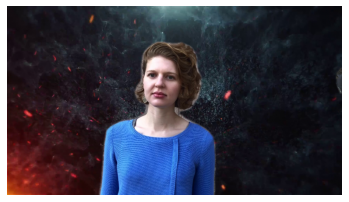

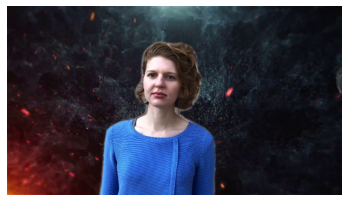

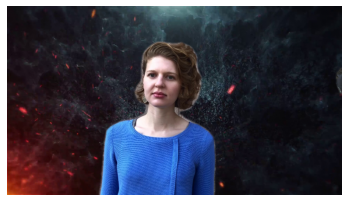

...

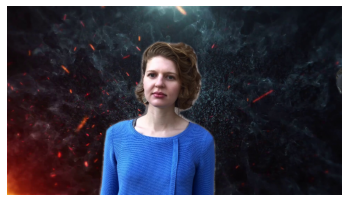

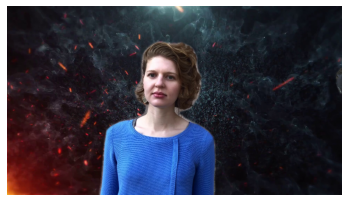

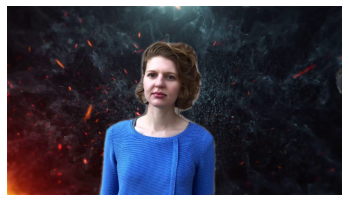

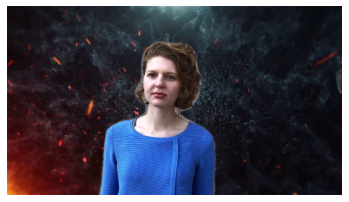

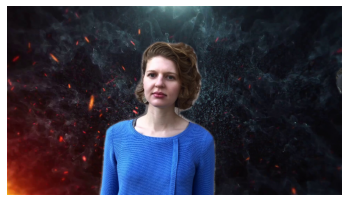

KeyboardInterrupt: ignored

In [ ]:
import glob
# dst = 'output'
# i = 0
for bb,img in enumerate (glob.glob("/content/drive/MyDrive/input_frames/*.jpg")):
  for bg in glob.glob("/content/drive/MyDrive/bg_frames/*.jpg"):
    segment(dlab, img, bg, show_orig=False)

In [ ]:
# import glob
# import cv2
# import numpy as np
# import imutils
# import time

# for bb,img in enumerate (glob.glob("Output/*.jpg")):
#     frame = cv2.imread(img, cv2.IMREAD_COLOR)

# h, w, c = frame.shape
    
# video_output_file_name = 'output' + '.mp4'
# video_out = cv2.VideoWriter(video_output_file_name,cv2.VideoWriter_fourcc(*'avc1'), 10, (w, h))

In [ ]:
# segment(dlab, 'input_frame1.jpg','bg_frame1.jpg', show_orig=True)
# #segment(dlab, './images/change/girl.png','./images/change/forest.png', show_orig=False)